# Produce Price Prediction with Prophet

Trains a prophet model on each produce item's data
includes cells that take care of hyperparameter tuning (using a randomized search), testing, and prediction
outputs MAPE

In [3]:
import fbprophet as fp
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import time
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
import random
sns.set_style("darkgrid")

In [4]:
def read_trimmed_data_prophet(city, veggie, data_dir):
    """reads in cleaned .csv data for one city and veggie, returns in the format for prophet
    """
    output_data = pd.read_csv(data_dir+veggie+'_'+city+'_TRIM.csv')
    output_data.rename(columns={'Date': 'ds', 'IA Average Price': 'y'}, inplace=True)
    output_data['ds'] = pd.to_datetime(output_data['ds'])
    output_data = output_data[['ds', 'y']].dropna()
    output_data = output_data.reset_index(drop=True)
    return output_data

In [5]:
def read_trimmed_data_notprophet(city, veggie, data_dir):
    """reads in cleaned .csv data for one city and veggie, returns the data as it was read in
    """
    output_data = pd.read_csv(data_dir+veggie+'_'+city+'_TRIM.csv')
    output_data.rename(columns={'Date': 'Date'}, inplace=True)
    output_data['Date'] = pd.to_datetime(output_data['Date'])
    output_data = output_data.sort_values(by='Date')
    output_data = output_data.reset_index(drop=True)
    output_data = output_data.dropna()
    return output_data

In [6]:
def nearest_date(dates, targdate):
    """given a pd series of dates and a target date, returns date from the series closest to target
    date (and distance)
    """
    for i in dates:
        i = i.to_pydatetime()
    nearest = min(dates, key=lambda x: abs(x - targdate))
    timedelta = abs(nearest - targdate)
    return nearest, timedelta

In [7]:
def plot_pct_misses_prophet(miss_array, city, title):
    """plot barchart of percent misses
    """
    plt.rcParams['xtick.labelsize']=14
    plt.rcParams['ytick.labelsize']=14
    plt.figure(figsize=(20,5))
    plt.xticks(rotation=90)
    
    xpos = np.arange(len(miss_array['veggie']))                
    plot = plt.bar(xpos, miss_array['mape'])
    plt.xticks(xpos, miss_array['veggie'])
    plt.ylabel('MAPE', fontsize=14)
    plt.title(title+'_'+city)

    plt.savefig(title+'_'+city+'_pctmiss.pdf', format='pdf', bbox_inches='tight')

In [8]:
# veggie and city data
veggienames = ['APPLES','APRICOTS','ASPARAGUS','AVOCADOS','BANANAS','BEANS','BEETS','BLACKBERRIES',
               'BLUEBERRIES','BROCCOLI','BRUSSELS+SPROUTS', 'CABBAGE','CANTALOUPS','CARROTS',
               'CAULIFLOWER','CELERY','CHERRIES','CLEMENTINES', 'CUCUMBERS','ENDIVE','GARLIC',
               'GINGER+ROOT','GRAPEFRUIT','GRAPES','HONEYDEWS','KIWIFRUIT','LEMONS','LETTUCE%2C+ICEBERG',
               'LETTUCE%2C+ROMAINE','LETTUCE%2C+RED+LEAF','LETTUCE%2C+GREEN+LEAF', 'LIMES','NECTARINES',
               'OKRA','ORANGES','PEACHES','PEARS','PEAS+GREEN','PEPPERS%2C+BELL+TYPE','PINEAPPLES',
               'PLUMS','POTATOES','RADISHES','RASPBERRIES','RHUBARB','SPINACH','SQUASH','STRAWBERRIES']
cities = ['NEW+YORK', 'LOS+ANGELES']

#cities=['LOS+ANGELES']
#veggienames = ['PEARS']
datadir = '../trimmed_data_and_plots/'

# master start date
master_start_date = '20070601'
master_start_date= pd.to_datetime(master_start_date)


# 1. Hyperparameter tuning

In [9]:
# cross_validation
def random_grid_search(tuple_of_value_ranges):
    """take in tuple of parameters to search over, randomly sample from each element in the tuple
    """
    selected_values = []
    for value_range in tuple_of_value_ranges:
        selected_values.append(random.choice(value_range))
    return selected_values

# define start and end dates for cross-validation, window step and horizon
xval_start_date = 8*365
xval_end_date = pd.to_datetime('20170530')
xval_period = 100
xval_horizon = 90

# define parameter grids to search over
chgpt_range = [0.8]
chgpt_pscale = [0.05, 0.3, 0.5]
yrly_season = [8, 10, 15]
season_mode=['additive']
# number of times to resample
n_xval_iters = 5



best_params = []
time1 = time.time()
# do this for all produce items, cities
for city in cities:
    for veg in veggienames:
        # for each item cross validate n_xval_iters times
        xval_output_stats = []
        try:
            for i in range(n_xval_iters):
                parameters = random_grid_search((chgpt_range, chgpt_pscale, yrly_season, season_mode))
                # read in data 
                produce_data = read_trimmed_data_prophet(city, veg, datadir)
                # nearest dates in the data to end dates,
                nearest_xval_end,_ = nearest_date(produce_data['ds'], xval_end_date)

                # trim the dates beyond the xval set off the dataset
                xval_data = produce_data.where(produce_data['ds']<nearest_xval_end).dropna()

                # initialize prophet model with sampled parameters, fit data
                m = fp.Prophet(weekly_seasonality=False, daily_seasonality=False, 
                              changepoint_range=parameters[0],
                              changepoint_prior_scale=parameters[1],
                              yearly_seasonality=parameters[2],
                              seasonality_mode=parameters[3])

                m.fit(xval_data)

                # cross validate using the xval window
                m_cv = cross_validation(m, initial=str(xval_start_date)+' days', period=str(xval_period)+' days',
                                        horizon = str(xval_horizon)+' days')
                # compute performance metrics
                m_p = performance_metrics(m_cv, rolling_window=xval_horizon)
                # store result with params
                parameters.append(m_p['mape'].values[0])

                xval_output_stats.append(parameters)
            # find best parameter combo
            stats = pd.DataFrame(xval_output_stats, columns=['chgpt_range', 'chgpt_pscale',
                                                             'yrly_season', 'season_mode','mape'])
            stats = stats.sort_values('mape')
            # put best parameter combo into output list
            best_stats = stats.iloc[0].values.tolist()
            best_stats = [city] + [veg] + best_stats
            best_params.append(best_stats)
            print('finished '+city+' '+veg)
        except ValueError:
            print('warning, problem setting the xval dates...skipping '+city+' '+veg)

print('done in ', time.time()-time1)
output_best_stats = pd.DataFrame(best_params, columns=['city','veggie','chgpt_range', 'chgpt_pscale', 'yrly_season',
                                                       'season_mode','mape'])

output_best_stats.to_csv('prophet_crossval_bestparams.csv')

"\n# cross_validation\n\n# define start and end dates for cross-validation, window step and horizon\nxval_start_date = 8*365\nxval_end_date = pd.to_datetime('20170530')\nxval_period = 100\nxval_horizon = 90\n\n# define parameter grids to search over\nchgpt_range = [0.8]\nchgpt_pscale = [0.05, 0.3, 0.5]\nyrly_season = [8, 10, 15]\nseason_mode=['additive']\n# number of times to resample\nn_xval_iters = 5\n\ndef random_grid_search(params):\n    # take in tuple of params, randomly sample from each element in the tuple\n    selected_params = []\n    for param in params:\n        selected_params.append(random.choice(param))\n    return selected_params\n\nbest_params = []\ntime1=time.time()\n# do this for all produce items, cities\nfor c in cities:\n    for v in veggienames:\n        # for each item cross validate n_xval_iters times\n        xval_output_stats = []\n        try:\n            for i in range(n_xval_iters):\n                parameters = random_grid_search((chgpt_range, chgpt_psca

# 2. Testing with best hyperparameters

In [10]:

# now testing using the best parameters from the previous step

# start date to run tests
test_start = '20170601'
test_start_date = pd.to_datetime(test_start)

test_period = 30
test_horizon = 90
# read in best parameters dataframe
best_params = pd.read_csv('prophet_crossval_bestparams.csv')

test_stats = []
for index, row in best_params.iterrows():
    try:
        # read in data
        produce_data = read_trimmed_data_prophet(row['city'], row['veggie'], datadir)
        # start date for testing
        nearest_test_start,_ = nearest_date(produce_data['ds'], test_start_date)
        training_dates = nearest_test_start - master_start_date

        # initialize prophet model with sampled parameters, fit data
        m = fp.Prophet(weekly_seasonality=False, daily_seasonality=False, 
                      changepoint_range=row['chgpt_range'],
                      changepoint_prior_scale=row['chgpt_pscale'],
                      yearly_seasonality=row['yrly_season'],
                      seasonality_mode=row['season_mode'])
        m.fit(produce_data)

        # now use the cross-validation option to actually test the data with the right hyperparameters
        m_test = cross_validation(m, initial=training_dates, period=str(test_period)+' days',
                                  horizon = str(test_horizon)+' days')
        # compute performance metrics
        m_p = performance_metrics(m_test, rolling_window=test_horizon)
        # store result with params
        metric = m_p['mape'].values[0]
        test_stats.append([row['city'], row['veggie'], metric])
    except ValueError:
        print('warning, problem setting the xval dates...skipping '+row['city']+' '+row['veggie'])

output_test_stats = pd.DataFrame(test_stats, columns=['city', 'veggie', 'mape'])


# DONT FORGET TO UNCOMMENT THIS WHEN RUNNING
output_test_stats.to_csv('prophet_test_performance.csv')



"\n# now testing using the best parameters from the previous step\n\n# start date to run tests\ntest_start = '20170601'\ntest_start_date = pd.to_datetime(test_start)\n\ntest_period = 30\ntest_horizon = 90\n# read in best parameters dataframe\nbest_params = pd.read_csv('prophet_crossval_bestparams.csv')\n\ntest_stats = []\nfor index, row in best_params.iterrows():\n    try:\n        # read in data\n        data = read_trimmed_data_prophet(row['city'], row['veggie'], datadir)\n        # start date for testing\n        nearest_test_start,_ = nearest_date(data['ds'], test_start_date)\n        training_dates = nearest_test_start - master_start_date\n\n        # initialize prophet model with sampled parameters, fit data\n        m = fp.Prophet(weekly_seasonality=False, daily_seasonality=False, \n                      changepoint_range=row['chgpt_range'],\n                      changepoint_prior_scale=row['chgpt_pscale'],\n                      yearly_seasonality=row['yrly_season'],\n        

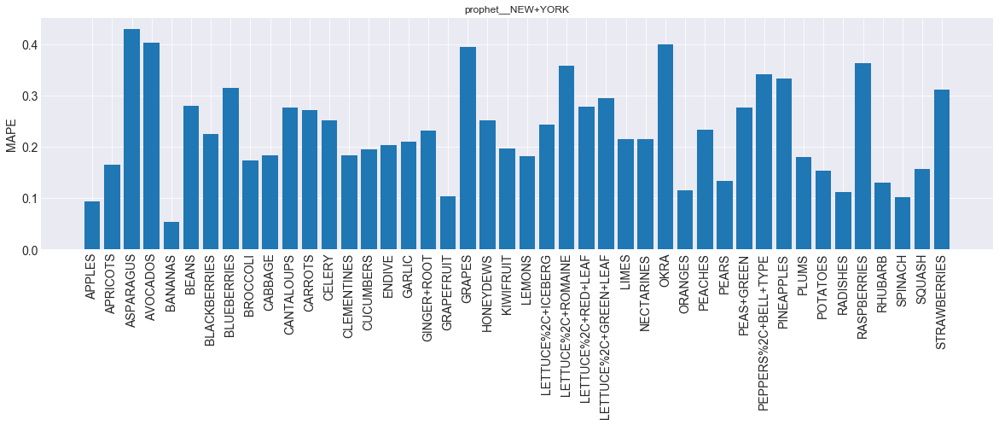

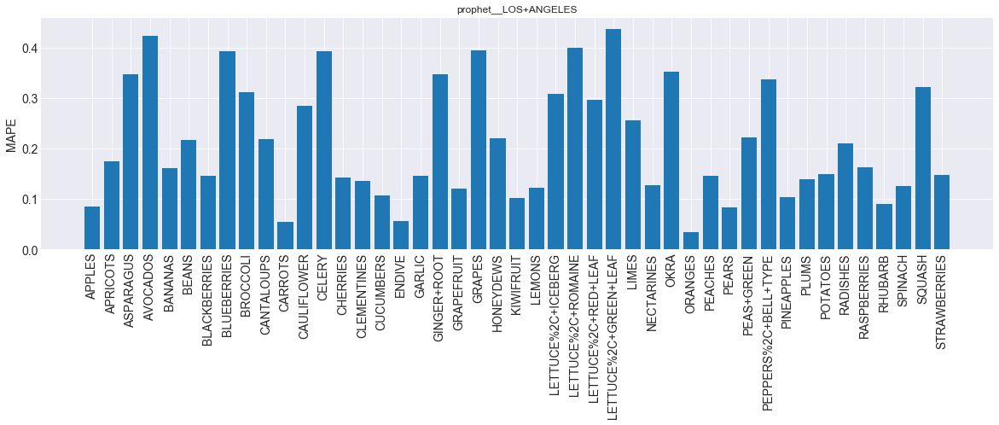

In [17]:
# now visualize the test performance
results = pd.read_csv('prophet_test_performance.csv')
title = 'prophet_'
for i in cities:
    plot_pct_misses_prophet(results[results['city']==i], i, title)

# 3. Predicting

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


NEW+YORK APPLES
NEW+YORK APRICOTS
NEW+YORK ASPARAGUS
NEW+YORK AVOCADOS
NEW+YORK BANANAS
NEW+YORK BEANS
NEW+YORK BEETS
NEW+YORK BLACKBERRIES
NEW+YORK BLUEBERRIES
NEW+YORK BROCCOLI
NEW+YORK BRUSSELS+SPROUTS


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


NEW+YORK CABBAGE
NEW+YORK CANTALOUPS
NEW+YORK CAULIFLOWER
NEW+YORK CARROTS
NEW+YORK CELERY
NEW+YORK CHERRIES
NEW+YORK CLEMENTINES
NEW+YORK CUCUMBERS
NEW+YORK ENDIVE
NEW+YORK GARLIC
NEW+YORK GINGER+ROOT
NEW+YORK GRAPEFRUIT
NEW+YORK GRAPES
NEW+YORK HONEYDEWS
NEW+YORK KIWIFRUIT
NEW+YORK LEMONS
NEW+YORK LETTUCE%2C+ICEBERG
NEW+YORK LETTUCE%2C+ROMAINE
NEW+YORK LETTUCE%2C+RED+LEAF
NEW+YORK LETTUCE%2C+GREEN+LEAF
NEW+YORK LIMES
NEW+YORK NECTARINES
NEW+YORK OKRA
NEW+YORK ORANGES
NEW+YORK PEACHES
NEW+YORK PEARS
NEW+YORK PEAS+GREEN
NEW+YORK PEPPERS%2C+BELL+TYPE
NEW+YORK PINEAPPLES
NEW+YORK PLUMS
NEW+YORK POTATOES
NEW+YORK RADISHES
NEW+YORK RASPBERRIES
NEW+YORK RHUBARB
NEW+YORK SPINACH
NEW+YORK SQUASH
NEW+YORK STRAWBERRIES
LOS+ANGELES APPLES
LOS+ANGELES APRICOTS
LOS+ANGELES ASPARAGUS
LOS+ANGELES AVOCADOS
LOS+ANGELES BANANAS
LOS+ANGELES BEANS
LOS+ANGELES BEETS
LOS+ANGELES BLACKBERRIES
LOS+ANGELES BLUEBERRIES
LOS+ANGELES BROCCOLI
LOS+ANGELES BRUSSELS+SPROUTS
LOS+ANGELES CABBAGE
LOS+ANGELES CANTALOUPS

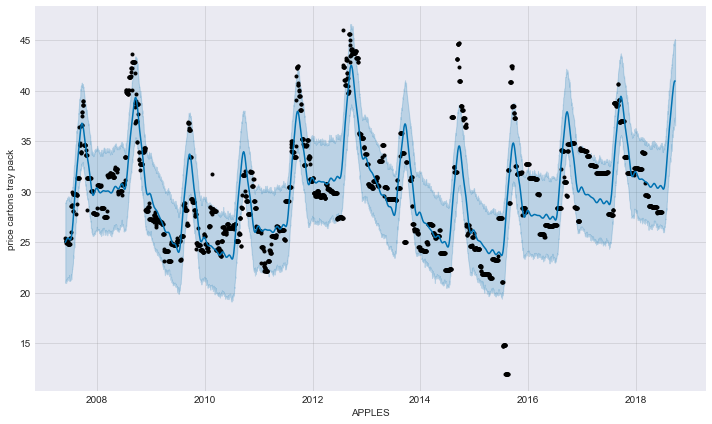

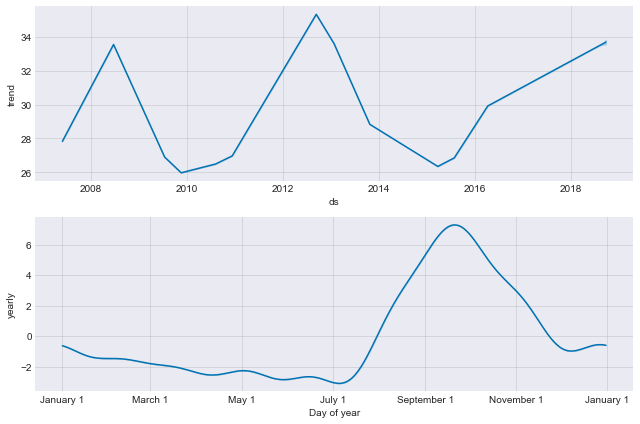

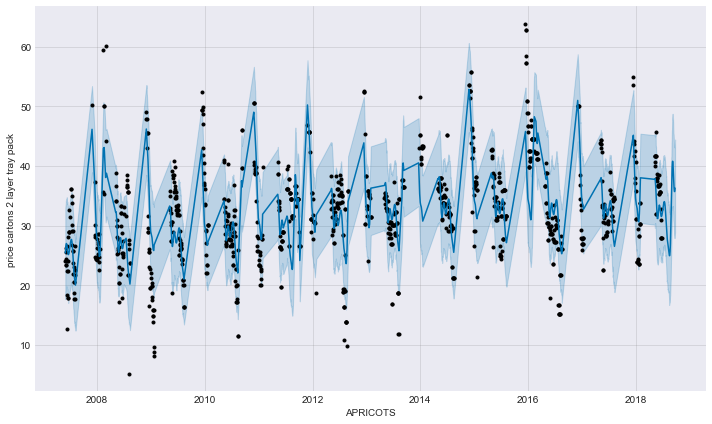

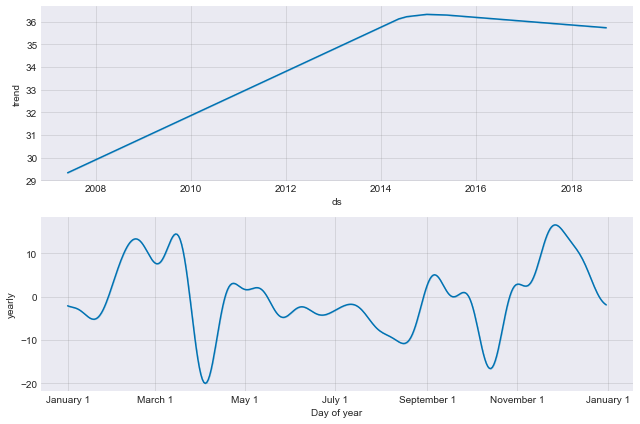

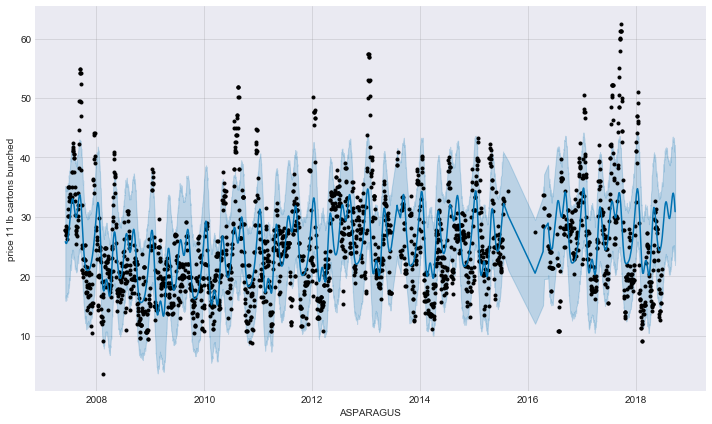

...

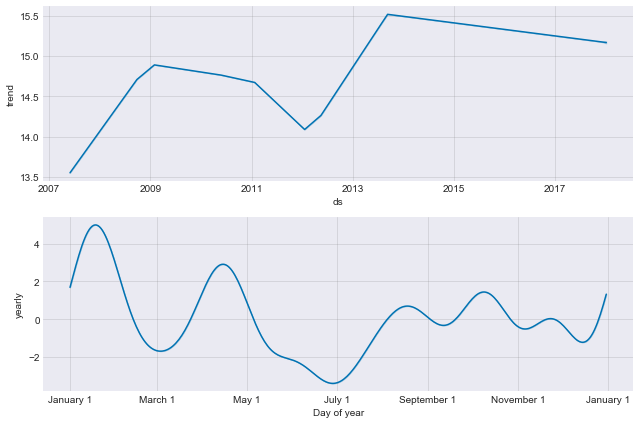

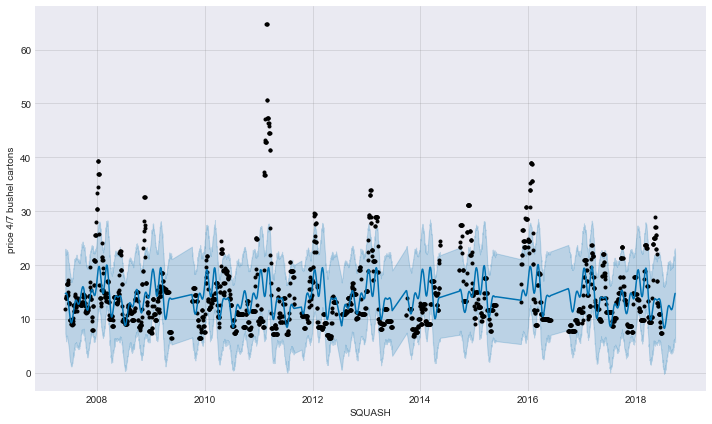

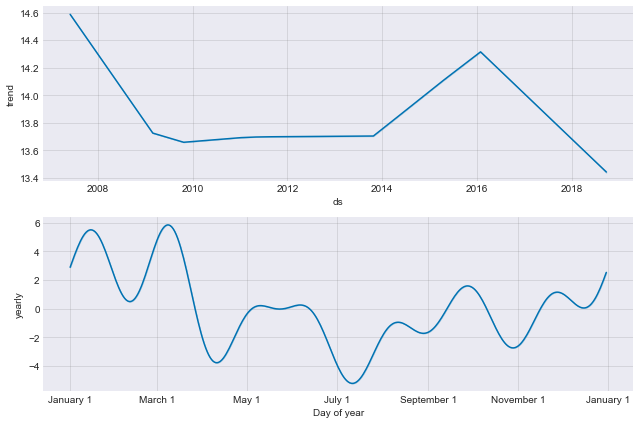

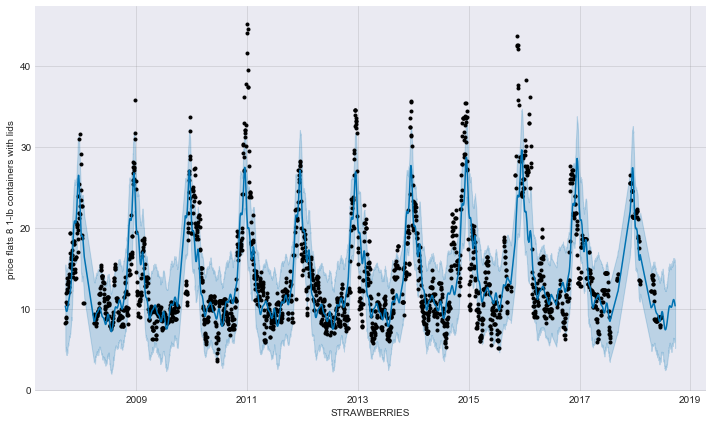

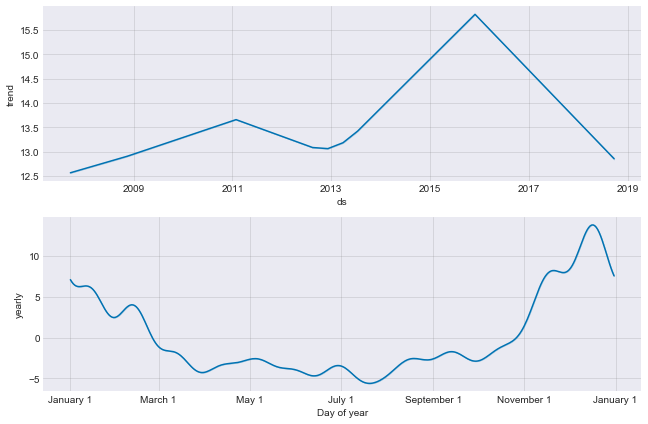

In [13]:
# now run the predictions
predict_horizon = 90
# read in best parameters dataframe
best_params = pd.read_csv('prophet_crossval_bestparams.csv')
test_stats = []
for index, row in best_params.iterrows():
    # read in data
    produce_data = read_trimmed_data_prophet(row['city'], row['veggie'], datadir)
    # double readin for now
    useful_info = read_trimmed_data_notprophet(row['city'], row['veggie'], datadir)
    # initialize prophet model with sampled parameters, fit data
    m = fp.Prophet(weekly_seasonality=False, daily_seasonality=False, 
                  changepoint_range=row['chgpt_range'],
                  changepoint_prior_scale=row['chgpt_pscale'],
                  yearly_seasonality=row['yrly_season'],
                  seasonality_mode=row['season_mode'])
    m.fit(produce_data)
    # grab the item size
    try:
        item_size = useful_info.iloc[0]['Package']
    except KeyError:
        try:
            item_size = useful_info.iloc[0]['Item Size']
        except KeyError:
            item_size = ''
    
    # grab the variety
    try:
        item_type = useful_info.iloc[0]['Variety']
    except KeyError:
        item_type = ''

    # predict the price outlook
    prediction_dates = m.make_future_dataframe(periods=predict_horizon)
    prediction = m.predict(prediction_dates)
    # save the predictions
    prediction_save = prediction[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].set_index('ds')
    prediction_save = prediction_save.join(produce_data[['ds', 'y']].set_index('ds'))
    prediction_save.to_csv(row['city']+'_'+row['veggie']+'_prophet_output.csv')
    
    # save verbose predictions (for plotting purposes)
    vprediction_save = prediction.set_index('ds')
    vprediction_save = vprediction_save.join(produce_data[['ds', 'y']].set_index('ds'))
    vprediction_save.to_csv(row['city']+'_'+row['veggie']+'_verbose_output.csv')
    
    # compute averages
    actual_predictions = prediction.tail(predict_horizon)
    avg_price = round(actual_predictions['yhat'].mean(),2)
    avg_upper = round(actual_predictions['yhat_upper'].mean(),2)
    avg_lower = round(actual_predictions['yhat_lower'].mean(),2)
    
    # current price
    current_data = produce_data.iloc[-7:]
    current_price = round(current_data['y'].mean(),2)
    
    # historical average
    historical_price = round(produce_data['y'].mean(),2)
    
    # year ago price
    one_year = pd.to_timedelta(pd.np.ceil(365), unit='D')
    most_recent_date = produce_data.iloc[-1]
    most_recent_date = most_recent_date['ds']
    year_ago_date,_ = nearest_date(produce_data['ds'], most_recent_date-one_year)
    year_ago_price = produce_data.iloc[produce_data[produce_data['ds'] == 
                                                    year_ago_date].index[0]-7:produce_data[produce_data['ds'] == 
                                                                                           year_ago_date].index[0]]
    year_ago_price = round(year_ago_price['y'].mean(),2)
    
    # year ago 3 month outlook actual
    ninety = pd.to_timedelta(pd.np.ceil(90), unit='D')
    year_ago_end3,_ = nearest_date(produce_data['ds'], most_recent_date-one_year+ninety)

    year_ago_outlook = produce_data.iloc[produce_data[produce_data['ds'] == 
                                                      year_ago_date].index[0]:produce_data[produce_data['ds'] == 
                                                                                           year_ago_end3].index[0]]
    year_ago_outlook = round(year_ago_outlook['y'].mean(),2)
    
    test_stats.append([row['city'], row['veggie'], item_type, item_size, current_price, avg_price, avg_upper,
                       avg_lower, historical_price, year_ago_price, year_ago_outlook])
    
    print(row['city']+' '+row['veggie'])
    # plot results
    fig1 = m.plot(prediction, ylabel='price '+item_size, xlabel=row['veggie']).savefig(row['city']+'_'+row['veggie']
                                                                                       +'.pdf')
    fig2 = m.plot_components(prediction).savefig(row['city']+'_'+row['veggie']+'_comp'+'.pdf')

output_file = pd.DataFrame(test_stats, columns=['City', 'Item','Variety','Package Size', 'Current Price',
                                                '3 Month Prediction', 'uError', 'lError', 'Historical Price',
                                                'Year Ago Price', 'Year Ago Outlook'])

nystuff = output_file[output_file['City']=='NEW+YORK']
nystuff.to_csv('ny_prophet_predictions.csv')

lastuff = output_file[output_file['City']=='LOS+ANGELES']
lastuff.to_csv('la_prophet_predictions.csv')